                            SPEAKER RECOGNITION

   ![voice-recognition-highres.jpg](https://images.openai.com/thumbnails/url/mkaJtHicu1mUUVJSUGylr5-al1xUWVCSmqJbkpRnoJdeXJJYkpmsl5yfq5-Zm5ieWmxfaAuUsXL0S7F0Tw4y160od9PNdC8MD4is0A1Iz_V3NQwyNCzQ1fV1sygzMogssgQqDDVwrSgujrIIL_VIDEjxL0rzClcrBgCXtigR)




## Introdución

El **reconocimiento de hablantes** y el **reconocimiento de voz** son dos campos distintos pero relacionados dentro del dominio más amplio del procesamiento y análisis de señales de audio. A continuación, se presentan las principales diferencias entre ellos:

1. **Objetivo:**
   - **Reconocimiento de hablantes:** El objetivo principal es identificar o verificar la identidad de un hablante en función de sus características vocales únicas, conocidas como "huellas de voz" o "firmas biométricas". Es una forma de autenticación biométrica.  
   - **Reconocimiento de voz:** El objetivo principal es convertir el lenguaje hablado en texto u otros tipos de comandos. Los sistemas de reconocimiento de voz analizan señales de audio para comprender y transcribir las palabras pronunciadas.  

2. **Enfoque:**
   - **Reconocimiento de hablantes:** Se centra en las características únicas de la voz de una persona, como el tono, timbre, acento y patrones de habla, para establecer su identidad.  
   - **Reconocimiento de voz:** Se centra en comprender e interpretar el contenido lingüístico de las palabras habladas, sin importar quién las diga. Implica convertir el lenguaje hablado en representación textual.  

3. **Aplicaciones:**
   - **Reconocimiento de hablantes:** Se utiliza comúnmente en sistemas de seguridad, control de acceso y aplicaciones de autenticación donde se debe verificar la identidad del hablante.  
   - **Reconocimiento de voz:** Se aplica en asistentes activados por voz, servicios de transcripción, comandos de voz en dispositivos inteligentes y sistemas de respuesta de voz interactiva (IVR).  

4. **Desafíos:**
   - **Reconocimiento de hablantes:** Afronta desafíos como las variaciones de la voz debido a la salud, el estado emocional o las condiciones ambientales. También debe tener en cuenta posibles intentos de suplantación de voz.  
   - **Reconocimiento de voz:** Sus desafíos incluyen manejar variaciones de acento, ruido de fondo y la comprensión del lenguaje dependiente del contexto. Requiere técnicas avanzadas de procesamiento de lenguaje natural (PLN).  

5. **Técnicas:**
   - **Reconocimiento de hablantes:** Utiliza técnicas como verificación de hablante (confirmar identidad) e identificación de hablante (nombrar al hablante) basadas en extracción de características y emparejamiento de patrones.  
   - **Reconocimiento de voz:** Utiliza técnicas como Modelos Ocultos de Markov (HMM), redes neuronales profundas (DNN) y redes neuronales recurrentes (RNN) para el modelado acústico y lingüístico.  

6. **Salida:**
   - **Reconocimiento de hablantes:** Entrega la identidad o el resultado de verificación del hablante.  
   - **Reconocimiento de voz:** Entrega el texto transcrito o los comandos hablados reconocidos.  

Aunque el reconocimiento de hablantes y el reconocimiento de voz tienen objetivos distintos, pueden complementarse en aplicaciones donde sea necesario considerar tanto la identidad del hablante como el contenido hablado, como en sistemas de seguridad con comandos de voz.


## **Planteamiento del problema:**  
En este proyecto, contamos con **1500 archivos `.wav` de 1 segundo** para cada uno de los **5 hablantes**. El objetivo es entrenar un modelo **RNN (Red Neuronal Recurrente)** para predecir si el modelo logra capturar correctamente al hablante.  

También se dispone de archivos de **ruido de fondo** en carpetas separadas, los cuales podrían usarse para mejorar la capacidad de generalización del modelo; sin embargo, en esta implementación inicial no se incluirán.  

Las **Redes Neuronales Recurrentes (RNN)** son especialmente adecuadas para ciertos aspectos del **reconocimiento de hablantes** debido a su capacidad para:  
- Modelar dependencias secuenciales.  
- Capturar patrones temporales en los datos de audio.  


## IMPORTANDO LIBRERÍAS

In [5]:
# Importando librerías principales

import numpy as np  
import pandas as pd  
import os  # Proporciona funciones para interactuar con el sistema operativo (rutas, directorios, archivos)
import shutil  # Permite copiar, mover o eliminar archivos y directorios
import matplotlib.pyplot as plt  
import numpy as np  

Quiero combinar los **primeros 2 minutos** de los archivos de audio de cada hablante y escuchar algunas muestras.  
Estoy utilizando la carpeta de **salida de local** para combinar los archivos.


In [6]:
import os
import shutil

# Ruta local de salida donde se guardarán los archivos combinados
output_dir = os.path.join("archive", "combined_files")

# Limpia el directorio si ya existe
shutil.rmtree(output_dir, ignore_errors=True)

# Vuelve a crearlo vacío
os.makedirs(output_dir, exist_ok=True)

print(f"✅ Contenido de {output_dir} limpiado y listo para nuevos archivos.")


✅ Contenido de archive/combined_files limpiado y listo para nuevos archivos.


## Crear archivos combinados para cada hablante


Usando los paquetes **librosa** y **soundfile** para crear los archivos combinados.  
Solo estoy tomando los **primeros 120 archivos** de cada carpeta de hablante para crear fragmentos de **2 minutos** de cada discurso.  

- **librosa**: es un paquete de Python para el análisis de música y audio. Proporciona herramientas para analizar y visualizar datos de audio, incluyendo funciones para extracción de características, representación en series de tiempo y visualización de señales de audio. Es ampliamente utilizado en el campo de la recuperación de información musical y el procesamiento de señales de audio.  

- **soundfile**: es una librería de Python para leer y escribir archivos de sonido. Ofrece una interfaz sencilla para trabajar con archivos de audio y soporta varios formatos como WAV, FLAC y OGG. A menudo se usa junto con **librosa** al trabajar con datos de audio, ya que facilita la carga y el guardado eficiente de archivos de audio.


# 🎯 Objetivo del código

El objetivo principal del script es **unir múltiples fragmentos de audio (`.wav`) de cada hablante en un solo archivo combinado**.  

## Desglose de pasos:
1. Define la ruta al dataset local de audios (`archive/16000_pcm_speeches`).
2. Crea un directorio de salida (`archive/combined_audios`) para guardar los resultados.
3. Recorre las carpetas de varios hablantes específicos.
4. De cada hablante, carga un número fijo de archivos (`0.wav` a `119.wav`).
5. Concatena los audios en una sola secuencia por hablante.
6. Guarda el archivo final combinado en formato `.wav` dentro de la carpeta de salida.
7. Al final, se obtiene **un único archivo de audio por cada hablante** con aproximadamente **2 minutos de duración**.


In [7]:
import os
import librosa  # Librería para análisis y procesamiento de audio
import soundfile as sf  # Librería para leer y escribir archivos de audio

# Ruta local al dataset de audios (dentro de "archive")
dataset_path = os.path.join("archive", "16000_pcm_speeches")

# Directorio de salida donde se guardarán los archivos combinados
output_dir = os.path.join("archive", "combined_audios")
os.makedirs(output_dir, exist_ok=True)  # Crea el directorio si no existe

# Lista de carpetas de los hablantes
speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]

# Número de archivos .wav que se van a combinar por hablante (120 archivos = 2 minutos)
num_files_to_combine = 120

# Itera sobre cada carpeta de hablante
for speaker_folder in speaker_folders:
    speaker_folder_path = os.path.join(dataset_path, speaker_folder)  # Ruta completa a la carpeta del hablante

    # Genera la lista de nombres de archivos .wav a combinar (del 0.wav al 119.wav)
    wav_files = [f"{i}.wav" for i in range(num_files_to_combine)]

    combined_audio = []  # Lista para almacenar el audio combinado
    sr = None  # Variable para la frecuencia de muestreo

    # Itera sobre cada archivo .wav y los concatena
    for wav_file in wav_files:
        wav_file_path = os.path.join(speaker_folder_path, wav_file)  # Ruta completa al archivo .wav
        audio, sr = librosa.load(wav_file_path, sr=None)  # Carga el audio y la frecuencia de muestreo
        combined_audio.extend(audio)  # Añade el audio cargado a la lista combinada

    # Guarda el audio combinado en un nuevo archivo .wav en el directorio de salida
    output_file_path = os.path.join(output_dir, f"{speaker_folder}_combined.wav")
    sf.write(output_file_path, combined_audio, sr)  # Escribe el archivo de audio combinado

print("✅ Combinación completa. Archivos guardados en:", output_dir)


✅ Combinación completa. Archivos guardados en: archive/combined_audios


**IPython** es una **consola interactiva de línea de comandos para Python**.  
Proporciona un entorno interactivo mejorado para la programación en Python y es particularmente popular entre **científicos de datos, investigadores e ingenieros** que trabajan en **computación científica, análisis de datos y aprendizaje automático**. ✅


In [8]:
import os
from IPython.display import display, Audio

# Ruta local al directorio donde guardaste los audios combinados
output_dir = os.path.join("archive", "combined_audios")

# Función para reproducir un archivo de audio
def play_audio(audio_path):
    # Muestra el reproductor de audio en la notebook
    display(Audio(filename=audio_path))

# Reproduce un archivo de audio combinado específico
speaker_file = "Benjamin_Netanyau_combined.wav"  # Nombre exacto del archivo combinado
audio_path = os.path.join(output_dir, speaker_file)  # Construye la ruta completa al archivo de audio
print(f"Haz clic en el botón para escuchar: {audio_path}")  # Mensaje en español indicando cómo reproducir el audio
play_audio(audio_path)  # Llama a la función para mostrar el reproductor de audio


Haz clic en el botón para escuchar: archive\combined_audios\Benjamin_Netanyau_combined.wav


In [9]:
import os
from IPython.display import display, Audio

# Ruta local al directorio donde guardaste los audios combinados
output_dir = os.path.join("archive", "combined_audios")

# Función para reproducir un archivo de audio
def play_audio(audio_path):
    # Muestra el reproductor de audio en la notebook
    display(Audio(filename=audio_path))

# Reproduce un archivo de audio combinado específico
speaker_file = "Nelson_Mandela_combined.wav"  # Nombre exacto del archivo combinado
audio_path = os.path.join(output_dir, speaker_file)  # Construye la ruta completa al archivo de audio
print(f"Haz clic en el botón para escuchar: {audio_path}")  # Mensaje en español indicando cómo reproducir el audio
play_audio(audio_path)  # Llama a la función para mostrar el reproductor de audio


Haz clic en el botón para escuchar: archive\combined_audios\Nelson_Mandela_combined.wav


## 📊 VISUALIZACIONES DE DATOS DE AUDIO  

Existen varias formas de representar gráficamente una señal de audio. Entre las más comunes están la **forma de onda (waveform)**, el **espectrograma** y los **coeficientes cepstrales en las frecuencias de Mel (MFCCs)**.  

---

### 🎵 1. Forma de onda (*Waveform*)  
- **Qué es:** Es una representación en el **dominio del tiempo** de la señal de audio.  
- **Ejes:**  
  - 🕒 Eje X: tiempo.  
  - 📈 Eje Y: amplitud (volumen o intensidad de la señal).  
- **Qué muestra:** Cómo cambia la amplitud del sonido a lo largo del tiempo.  
- **Interpretación:** Los **picos y valles** representan variaciones en la presión del aire, que percibimos como sonido.  

---

### 🎼 2. Espectrograma (*Spectrogram*)  
- **Qué es:** Es una representación en el **dominio de la frecuencia**.  
- **Ejes:**  
  - 🕒 Eje X: tiempo.  
  - 🎚️ Eje Y: frecuencia.  
  - 🎨 Color o intensidad: energía/magnitud de cada frecuencia.  
- **Qué muestra:** Una visión **2D del contenido frecuencial** del audio a lo largo del tiempo.  
- **Interpretación:** Las zonas más oscuras o intensas indican frecuencias con mayor energía en ese instante.  

---

### 🎙️ 3. MFCCs (*Mel-Frequency Cepstral Coefficients*)  
Los MFCCs son una forma avanzada de representar el audio en el **dominio de la frecuencia**. Capturan características muy útiles para el análisis de voz y sonido.  

- **Ejes del gráfico:**  
  - 🕒 Eje X: tiempo.  
  - 📊 Eje Y: distintas bandas de frecuencia (coeficientes).  
- **Extracción de características:**  
  Cada fila representa un coeficiente MFCC, que recoge propiedades únicas del sonido, como la forma del tracto vocal 🗣️.  
- **Características espectrales:**  
  Los picos y patrones reflejan frecuencias clave, como los **formantes** en la voz humana.  
- **Análisis de patrones de sonido:**  
  Al observar cómo varían los MFCCs en el tiempo, se pueden identificar patrones para:  
  - 🔊 Reconocimiento de voz.  
  - 😀 Identificación de emociones.  
  - 👤 Identificación de hablantes.  
  - 📝 Conversión de voz a texto.  

---

👉 En resumen:  
- La **forma de onda** muestra la intensidad en el tiempo.  
- El **espectrograma** revela cómo cambian las frecuencias.  
- Los **MFCCs** permiten extraer características únicas del audio para análisis más avanzados.  


👉 "Ahora veremos algunas gráficas correspondientes a distintos hablantes."

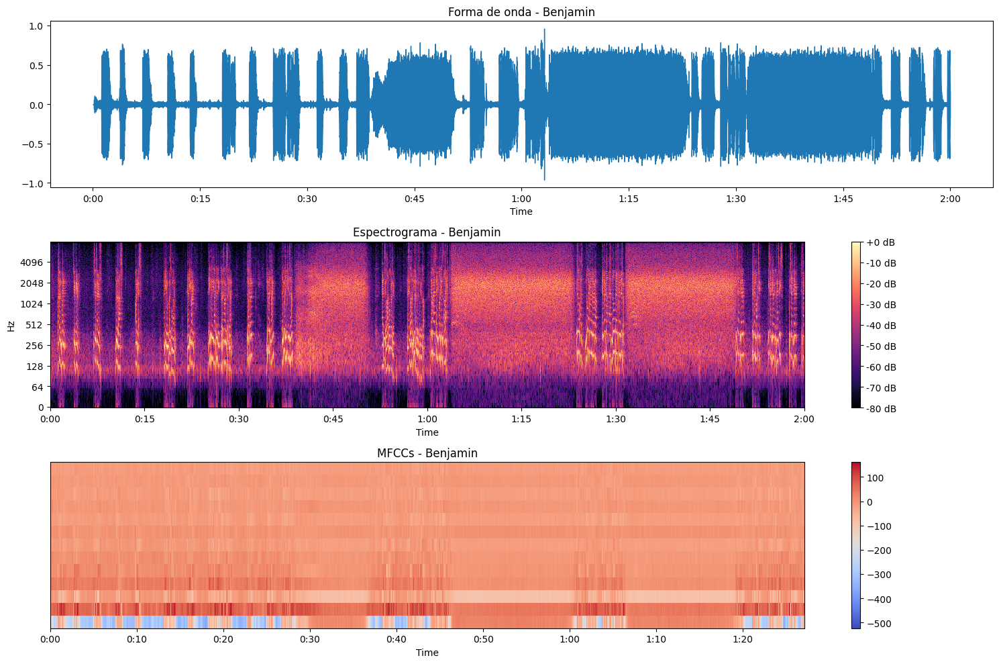

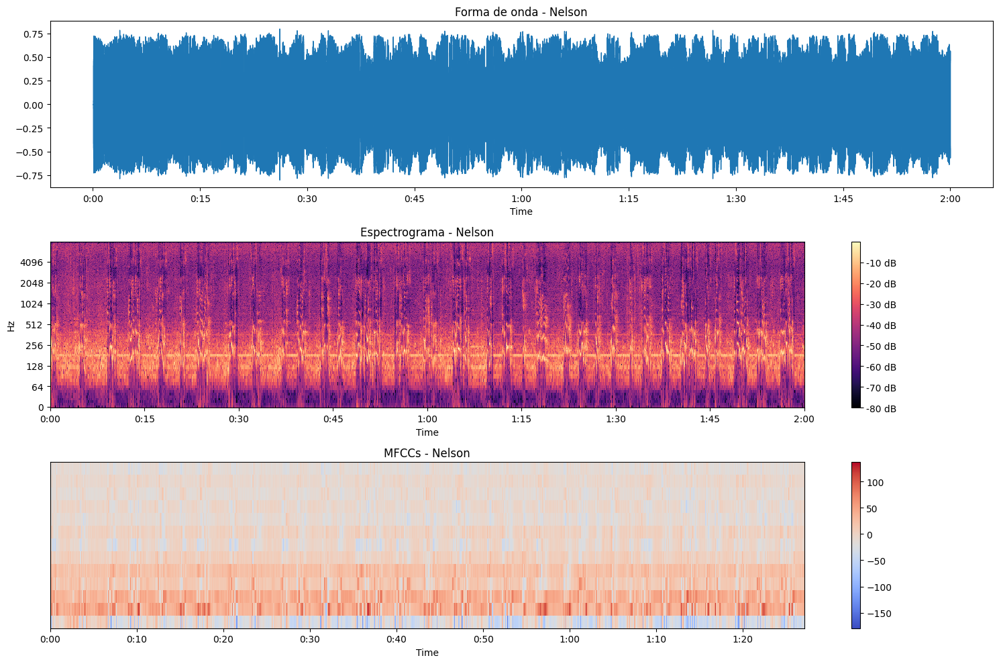

In [10]:
import librosa.display # Funciones de visualización específicas de audio (waveform, spectrogram, etc.)

# Función para graficar la forma de onda, espectrograma y MFCCs
def plot_audio_features(audio_path):
    # Carga el archivo de audio en 'y' (señal) y 'sr' (frecuencia de muestreo).
    # sr=None preserva la frecuencia original del archivo.
    # Por defecto librosa convierte a mono (mono=True). Si quieres estéreo, usa mono=False.
    y, sr = librosa.load(audio_path, sr=None)

    # Extrae el nombre del hablante a partir del nombre del archivo.
    # os.path.basename(...) obtiene el nombre del archivo con extensión.
    # split('_')[0] toma el texto antes del primer guion bajo como "nombre del hablante".
    speaker_name = os.path.basename(audio_path).split('_')[0]

    # Crea una figura de 15x10 pulgadas para acomodar tres subplots (waveform, spectrogram, MFCCs).
    plt.figure(figsize=(15, 10))

    # ---------- 1) Forma de onda ----------
    # Selecciona el primer subplot: 3 filas, 1 columna, posición 1.
    plt.subplot(3, 1, 1)
    # Dibuja la forma de onda (amplitud vs tiempo) usando la tasa de muestreo 'sr'.
    librosa.display.waveshow(y, sr=sr)
    # Título del primer gráfico.
    plt.title(f'Forma de onda - {speaker_name}')
    # (Opcional) Etiquetas de ejes podrían añadirse con plt.xlabel/plt.ylabel si lo deseas.

    # ---------- 2) Espectrograma ----------
    # Selecciona el segundo subplot: posición 2.
    plt.subplot(3, 1, 2)
    # Calcula la Transformada Rápida de Fourier de corto tiempo (STFT).
    # Recomendado: tomar el valor absoluto antes de convertir a dB.
    S = librosa.stft(y)                          # Espectrograma complejo (tiempo-frecuencia)
    D = librosa.amplitude_to_db(np.abs(S), ref=np.max)  # Convierte amplitud a decibelios, normalizado al máximo
    # Muestra el espectrograma con eje X en tiempo y eje Y en escala logarítmica de frecuencias.
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    # Barra de color para interpretar los dB.
    plt.colorbar(format='%+2.0f dB')
    # Título del segundo gráfico.
    plt.title(f'Espectrograma - {speaker_name}')

    # ---------- 3) MFCCs ----------
    # Selecciona el tercer subplot: posición 3.
    plt.subplot(3, 1, 3)
    # Calcula 13 coeficientes MFCC (valor típico en voz).
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    # Muestra los MFCCs a lo largo del tiempo (cada fila es un coeficiente).
    librosa.display.specshow(mfccs, x_axis='time')
    # Barra de color para interpretar la magnitud de los coeficientes.
    plt.colorbar()
    # Título del tercer gráfico.
    plt.title(f'MFCCs - {speaker_name}')

    # Ajusta automáticamente espacios para evitar solapamientos entre subplots.
    plt.tight_layout()
    # Renderiza los gráficos en la salida.
    plt.show()

# Rutas a los archivos de audio combinados
audio_paths = [
    'archive/combined_audios/Benjamin_Netanyau_combined.wav',
    'archive/combined_audios/Nelson_Mandela_combined.wav'
]
# Recorre cada ruta de audio y genera las tres visualizaciones definidas en la función.
for audio_path in audio_paths:
    plot_audio_features(audio_path)


# Comparación de características de voz

| Característica | Descripción | Benjamin | Nelson |
|----------------|-------------|----------|--------|
| **Forma de onda (Waveform)** | Representa la amplitud en el tiempo. Permite ver intensidad, pausas y fluidez del habla. | Onda con claras pausas y variaciones de intensidad → habla marcada y segmentada. | Onda más continua y uniforme → habla fluida y constante. |
| **Espectrograma** | Muestra la distribución de frecuencias a lo largo del tiempo, con colores según intensidad. | Patrones más segmentados y zonas con silencios → refleja variación de fonemas. | Espectrograma homogéneo y denso → voz más estable y continua. |
| **MFCCs (Coeficientes Cepstrales en Mel)** | Representación de cómo el oído humano percibe el sonido. Base para ML en reconocimiento de voz. | MFCCs con variaciones amplias → diferencias fonéticas claras. | MFCCs más uniformes → entonación más plana y constante. |
| **Estilo de habla** | Interpretación general basada en las visualizaciones. | Habla expresiva, con pausas marcadas y cambios en la entonación. | Habla fluida, monótona o constante en su entonación. |

---

## Conclusión
- **Benjamin:** estilo expresivo, pausado y con énfasis marcado.  
- **Nelson:** estilo fluido, continuo y más homogéneo.  


## EXTRACCIÓN DE CARACTERÍSTICAS

## 🎯 Extracción de características  

La **extracción de características** es un paso fundamental en la preparación de datos para tareas de *Machine Learning* e Inteligencia Artificial. Su importancia radica en varios aspectos clave:  

1. **📉 Reducción de dimensionalidad:**  
   Los datos en bruto (como audio, imágenes o texto) suelen ser muy complejos y de alta dimensión.  
   Al extraer características relevantes, reducimos la cantidad de información a procesar, haciéndola más manejable y eficiente computacionalmente.  

2. **🔎 Captura de información relevante:**  
   No toda la información de los datos originales es útil.  
   La extracción de características nos ayuda a identificar y conservar solo los elementos más importantes para la tarea específica.  

3. **🚫 Reducción de ruido:**  
   Al enfocarnos en atributos concretos, podemos filtrar detalles irrelevantes o ruidos presentes en los datos en bruto,  
   lo que mejora la robustez y precisión de los modelos.  

4. **⚡ Mejor desempeño de los modelos:**  
   Un conjunto de características bien definidas permite que los modelos generalicen mejor y realicen predicciones más precisas.  

5. **📚 Facilita el aprendizaje:**  
   Las características extraídas resaltan patrones, relaciones y estructuras en los datos  
   que hacen que el modelo aprenda más rápido y de forma más efectiva.  

6. **👀 Interpretabilidad humana:**  
   En muchos casos, las características extraídas son más fáciles de interpretar por humanos que los datos originales,  
   lo que ayuda a comprender cómo funciona un modelo y a confiar en sus predicciones.  

7. **🎯 Adaptación al dominio específico:**  
   Según el tipo de problema, se pueden extraer diferentes conjuntos de características  
   (por ejemplo, **MFCCs en audio**, **bordes en imágenes**, **tokens en texto**).  

8. **🔗 Manejo de datos multimodales:**  
   Cuando los datos provienen de distintas fuentes (audio, texto, imágenes),  
   la extracción de características permite integrarlos en una representación común, facilitando el análisis conjunto.  


In [ ]:
# ==============================
# 📌 Importación de librerías
# ==============================

import tensorflow as tf   # TensorFlow: para construir y entrenar redes neuronales
from sklearn.model_selection import train_test_split  # Divide datos en entrenamiento y prueba
from sklearn.preprocessing import LabelEncoder        # Convierte etiquetas (nombres de hablantes) en números
from sklearn.preprocessing import StandardScaler      # Normaliza datos para que estén en la misma escala



# =========================================================
# 📂 Ruta principal donde están las carpetas de hablantes
# =========================================================
# Dentro de esta carpeta están subcarpetas con audios .wav de cada persona.
# Ejemplo:
# archive/16000_pcm_speeches/
#   ├── Benjamin_Netanyau/
#   │      ├── audio1.wav
#   │      ├── audio2.wav
#   ├── Nelson_Mandela/
#   │      ├── audio1.wav
#   │      ├── audio2.wav

parent_dir = "archive/16000_pcm_speeches"


# =============================================
# 📋 Lista de carpetas con los nombres de voces
# =============================================
# Aquí especificamos las carpetas de hablantes a procesar.
speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]


# ==================================================
# 🛠️ Función para extraer características de audio
# ==================================================
# - Recorre todas las carpetas de hablantes.
# - Abre cada archivo .wav y extrae sus características (MFCC).
# - Los MFCC (Mel-Frequency Cepstral Coefficients) son una representación
#   numérica del audio muy usada en reconocimiento de voz.
def extract_features(parent_dir, speaker_folders):
    features = []   # Lista para guardar características de cada audio
    labels = []     # Lista para guardar etiquetas (número del hablante)

    # Recorremos cada carpeta de hablante
    for i, speaker_folder in enumerate(speaker_folders):
        speaker_folder_path = os.path.join(parent_dir, speaker_folder)  # Ruta de la carpeta

        # Recorremos todos los archivos dentro de la carpeta
        for filename in os.listdir(speaker_folder_path):
            if filename.endswith(".wav"):  # Solo archivos .wav
                file_path = os.path.join(speaker_folder_path, filename)  # Ruta completa

                # Cargamos el audio
                # sr=None → mantiene la frecuencia original
                # duration=1 → toma solo 1 segundo
                audio, sr = librosa.load(file_path, sr=None, duration=1)

                # Extraemos características MFCC
                mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)

                # Normalizamos las características
                mfccs = StandardScaler().fit_transform(mfccs)

                # Guardamos las características (transpuestas)
                features.append(mfccs.T)

                # Guardamos la etiqueta del hablante (0,1,2…)
                labels.append(i)

    # Retornamos arrays con características (X) y etiquetas (y)
    return np.array(features), np.array(labels)


# ==================================================
# 📊 Ejecución: extracción de características
# ==================================================
# Aquí procesamos todos los .wav de las carpetas y obtenemos:
# X → características MFCC de cada audio
# y → etiquetas (índice del hablante)
X, y = extract_features(parent_dir, speaker_folders)

# 🎙️ Interpretación de los Coeficientes MFCC

Los números en el arreglo representan las características **MFCC (Mel-Frequency Cepstral Coefficients)** extraídas para cada **cuadro de audio**.  
- Cada **fila** del arreglo corresponde a un cuadro (frame) de audio.  
- Cada **columna** corresponde a un coeficiente MFCC específico.  

El resultado será un arreglo de números que representan los coeficientes MFCC para el **primer cuadro del primer archivo de audio**.

---

## 📌 ¿Qué capturan los MFCC?
Los MFCC contienen información relacionada con la **forma del tracto vocal** durante la producción de sonidos del habla.  

- Los **primeros coeficientes** capturan información global (energía, pendiente espectral).  
- Los **coeficientes de orden superior** capturan detalles más finos de la estructura espectral.  

---

## 📊 Interpretación de algunos coeficientes MFCC

| **Coeficiente**        | **Descripción**                                                                 |
|-------------------------|---------------------------------------------------------------------------------|
| **MFCC 0 (primer coef.)** | Conocido como el término *constante*. Representa la **energía total** de la señal. |
| **MFCC 1 (segundo coef.)** | Representa la **pendiente espectral global**, relacionado con la **percepción del tono (pitch)**. |
| **MFCC 2 (tercer coef.)** | Captura la forma del tracto vocal, asociado a **formantes** en el habla. |
| **MFCC 3 (cuarto coef.)** | Refleja cambios en la **envolvente espectral**, puede estar relacionado con la **nasalidad**. |
| **MFCC 4 en adelante**   | Capturan características espectrales más detalladas, como **estructuras finas del espectro**. |

---

## ⚠️ Nota importante
- La interpretación puede variar según las características específicas del audio y el contexto de la aplicación.  
- En procesamiento de voz, los MFCC son más fáciles de interpretar en conjunto y no de forma aislada.  
- Revisar documentación o literatura del dataset puede dar información más precisa y adaptada al caso.  


In [12]:
# Imprime las primeras características extraídas
# Cada elemento en X representa las características MFCC de un archivo de audio
for feature in X[:1]:
    print(feature)

[[-3.46410155e+00  2.88717210e-01  2.88714826e-01  2.88710833e-01
   2.88705289e-01  2.88698137e-01  2.88689405e-01  2.88679123e-01
   2.88667232e-01  2.88653851e-01  2.88638890e-01  2.88622409e-01
   2.88604409e-01]
 [-3.46410155e+00  2.88697690e-01  2.88696378e-01  2.88694263e-01
   2.88691312e-01  2.88687497e-01  2.88682818e-01  2.88677305e-01
   2.88670957e-01  2.88663775e-01  2.88655698e-01  2.88646817e-01
   2.88637102e-01]
 [-3.46410179e+00  2.88694620e-01  2.88693517e-01  2.88691700e-01
   2.88689107e-01  2.88685828e-01  2.88681775e-01  2.88677037e-01
   2.88671494e-01  2.88665295e-01  2.88658351e-01  2.88650692e-01
   2.88642257e-01]
 [-3.41496515e+00  4.01689023e-01 -5.24659082e-02  6.99484289e-01
   2.78740406e-01  2.13533759e-01  3.30969363e-01  3.79182965e-01
   6.90628588e-02  2.89402455e-01  2.54391849e-01  3.14149320e-01
   2.36824706e-01]
 [-3.32731915e+00  5.34021258e-01 -3.14830184e-01  9.45635438e-01
   3.05575818e-01  2.24249974e-01  2.92698741e-01  3.76336753e-01


In [13]:
# La siguiente línea permite listar los dispositivos físicos disponibles en el sistema 
# que TensorFlow puede usar para realizar cálculos.
# En este caso, se pasa el argumento 'GPU', por lo que mostrará las GPUs detectadas.
# Si TensorFlow encuentra una GPU compatible (por ejemplo, NVIDIA con CUDA),
# imprimirá una lista con la información de la(s) GPU(s).
# Si no hay GPU disponible, la lista estará vacía ([]).

print(tf.config.list_physical_devices('GPU'))


[]


## CONFIGURACIÓN DEL MODELO - DIVISIÓN TRAIN/TEST Y EVALUACIÓN


Dividiendo los datos en un 70% para entrenamiento y el restante se dividirá en partes iguales para los conjuntos de validación y prueba.
.

In [15]:
from tensorflow.keras.callbacks import EarlyStopping  # Importa la clase EarlyStopping para detener el entrenamiento si no mejora
from sklearn.preprocessing import LabelEncoder        # Importa el codificador de etiquetas para convertir nombres en números

# Codifica las etiquetas usando clases explícitas
label_encoder = LabelEncoder()                       # Crea una instancia del codificador de etiquetas
y = label_encoder.fit_transform(y)                   # Ajusta y transforma las etiquetas originales a valores numéricos
label_encoder.classes_ = np.array(speaker_folders)   # Asigna manualmente las clases para mantener el orden de los hablantes

# Divide los datos en conjuntos de entrenamiento, validación y prueba
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)  # 70% entrenamiento, 30% temporal
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)  # 15% validación, 15% prueba

# Imprime las dimensiones de los datos de entrenamiento y validación
print("Forma de los datos de entrenamiento:", X_train.shape)
print("Forma de los datos de validación:", X_val.shape)

Forma de los datos de entrenamiento: (5250, 32, 13)
Forma de los datos de validación: (1125, 32, 13)


## TRAINING

## 🧠 Definiendo el modelo RNN y funciones de activación  

Cuando definimos un modelo de **Red Neuronal Recurrente (RNN)**, se utilizan funciones de activación como **ReLU** y **Softmax** en diferentes capas de la red.  

### ⚡ ReLU (Rectified Linear Unit)  
- 🔹 Es una función de activación comúnmente usada en las **capas ocultas** de las redes neuronales.  
- 🔹 Matemáticamente se define como:  
**f(x) = max(0, x)**


👉 Esto significa que la salida es **0 para entradas negativas** y **igual al valor de la entrada si es positiva**.  
- 🔹 Introduce **no linealidad** al modelo, permitiendo aprender patrones complejos.  

---

### 🎯 Softmax  
- 🔹 Se utiliza en la **capa de salida** de redes neuronales para problemas de **clasificación multiclase**.  
- 🔹 Convierte las salidas (logits) en una **distribución de probabilidades** sobre todas las clases.  
- 🔹 Cada valor representa la **probabilidad de pertenecer a una clase específica**.  
- 🔹 La clase con mayor probabilidad será la predicción final.  

En la arquitectura del modelo, la **última capa usa Softmax** para obtener las probabilidades sobre los distintos hablantes 🎤.  
La capa anterior usa **ReLU** para aportar no linealidad en la capa oculta.  

---

## ⚖️ Funciones de pérdida (Loss Functions)  

La elección de la función de pérdida depende del tipo de problema:  

- 📉 **Error Cuadrático Medio (MSE):**  
- Usado en problemas de **regresión**.  
- Penaliza al modelo por errores grandes.  

- 🌓 **Binary Crossentropy:**  
- Usado en **clasificación binaria** (0 o 1).  

- 🌈 **Categorical Crossentropy:**  
- Usado en **clasificación multiclase** con variables **one-hot encoded**.  

- 🔢 **Sparse Categorical Crossentropy:**  
- Similar a categorical crossentropy, pero se usa cuando las clases están en formato **índices enteros** (no en one-hot).  
- Evita tener que transformar las etiquetas manualmente.  

---

## 🚀 Elección en nuestro modelo  

- El problema es de **clasificación multiclase** (varios hablantes 🎤).  
- Por eso se usa **sparse_categorical_crossentropy** como función de pérdida.  
- El optimizador elegido es **Adam**, ya que adapta las tasas de aprendizaje de forma automática y es muy eficiente.  



### 🧠 Capas de una Red Neuronal

En el contexto de configurar capas de una red neuronal, los números **128** y **64** se refieren al número de **neuronas o unidades** en esas capas específicas.

---

#### 🔁 `tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2]))`

Esta es una capa **LSTM (Long Short-Term Memory)** con **128 unidades**.  
Las capas LSTM son un tipo de red neuronal recurrente (**RNN**) especialmente efectivas para datos secuenciales como series temporales o texto.

---

#### 🔗 `tf.keras.layers.Dense(64, activation='relu')`

Esta es una capa **densa (totalmente conectada)** con **64 unidades** y una función de activación **ReLU (Rectified Linear Unit)**.  
Las capas densas conectan cada neurona de una capa con todas las neuronas de la siguiente.

---

#### 🎯 `tf.keras.layers.Dense(len(speaker_folders), activation='softmax')`

Esta es la **capa de salida**, con tantas unidades como clases haya (determinado por `len(speaker_folders)`).  
La función de activación **softmax** se usa comúnmente en problemas de clasificación multiclase, ya que convierte los valores en **probabilidades**.

---

### ⚙️ Ajuste de Hiperparámetros

Las elecciones de **128** y **64** son algo arbitrarias y pueden ajustarse según las características específicas de tus datos y la complejidad del problema.  
El número de unidades en una capa es un **hiperparámetro** que puedes experimentar durante el ajuste del modelo.  
Problemas más complejos pueden requerir más unidades, pero esto también aumenta la capacidad del modelo y puede llevar al **sobreajuste** si no se controla adecuadamente.


### ⏹️ Detención Temprana y Configuración del Entrenamiento

También estamos utilizando **detención temprana (early stopping)** para evitar tiempo de ejecución adicional y **sobreajuste** en el conjunto de datos de entrenamiento. 🛑📉

🏃‍♂️ El modelo se entrena durante **20 épocas (epochs)** utilizando el **optimizador Adam** para la compilación. ⚙️🧪


Epoch 1/20
165/165 [==============================] - 4s 17ms/step - loss: 0.5046 - accuracy: 0.8017 - val_loss: 0.2400 - val_accuracy: 0.9102
Epoch 2/20
165/165 [==============================] - 2s 14ms/step - loss: 0.1739 - accuracy: 0.9381 - val_loss: 0.1818 - val_accuracy: 0.9431
Epoch 3/20
165/165 [==============================] - 2s 14ms/step - loss: 0.1434 - accuracy: 0.9488 - val_loss: 0.1469 - val_accuracy: 0.9493
Epoch 4/20
165/165 [==============================] - 2s 14ms/step - loss: 0.1034 - accuracy: 0.9600 - val_loss: 0.0999 - val_accuracy: 0.9707
Epoch 5/20
165/165 [==============================] - 2s 14ms/step - loss: 0.0829 - accuracy: 0.9684 - val_loss: 0.0974 - val_accuracy: 0.9689
Epoch 6/20
165/165 [==============================] - 2s 14ms/step - loss: 0.0613 - accuracy: 0.9796 - val_loss: 0.0990 - val_accuracy: 0.9662
Epoch 7/20
165/165 [==============================] - 2s 14ms/step - loss: 0.0586 - accuracy: 0.9800 - val_loss: 0.1263 - val_accuracy: 0.9644

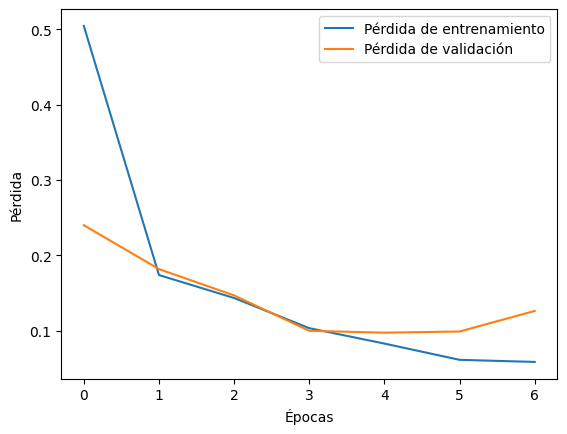

In [16]:
# ===========================
# 🧠 Definición del modelo RNN
# ===========================
# Se crea un modelo secuencial con una capa LSTM, una capa densa oculta y una capa de salida softmax.
model = tf.keras.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(speaker_folders), activation='softmax')
])

# ===========================
# ⚙️ Compilación del modelo
# ===========================
# Se compila el modelo usando el optimizador Adam y la función de pérdida adecuada para clasificación multiclase.
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# ===========================
# ⏹️ Definición de EarlyStopping
# ===========================
# EarlyStopping detiene el entrenamiento si la pérdida de validación no mejora después de 2 épocas.
early_stopping = EarlyStopping(monitor='val_loss', patience=2, restore_best_weights=True)

# ===========================
# 🚀 Entrenamiento del modelo
# ===========================
# Se entrena el modelo usando los datos de entrenamiento y validación, con EarlyStopping.
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32, callbacks=[early_stopping])

# ===========================
# 📢 Mensaje sobre EarlyStopping
# ===========================
# Se informa si EarlyStopping detuvo el entrenamiento antes de completar todas las épocas.
if early_stopping.stopped_epoch > 0:
    print("⏹️ Entrenamiento detenido tempranamente en la época", early_stopping.stopped_epoch + 1)
else:
    print("✅ Entrenamiento completado sin detención temprana")

# ===========================
# 📊 Gráfica de pérdida
# ===========================
# Se grafican las curvas de pérdida de entrenamiento y validación por época.
plt.plot(history.history['loss'], label='Pérdida de entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de validación')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()
plt.show()

## EVALUATION

36/36 [==============================] - 0s 4ms/step
Precisión en la evaluación del conjunto de prueba: 0.9804618117229129
Puntaje F1 ponderado: 0.9804815468431011


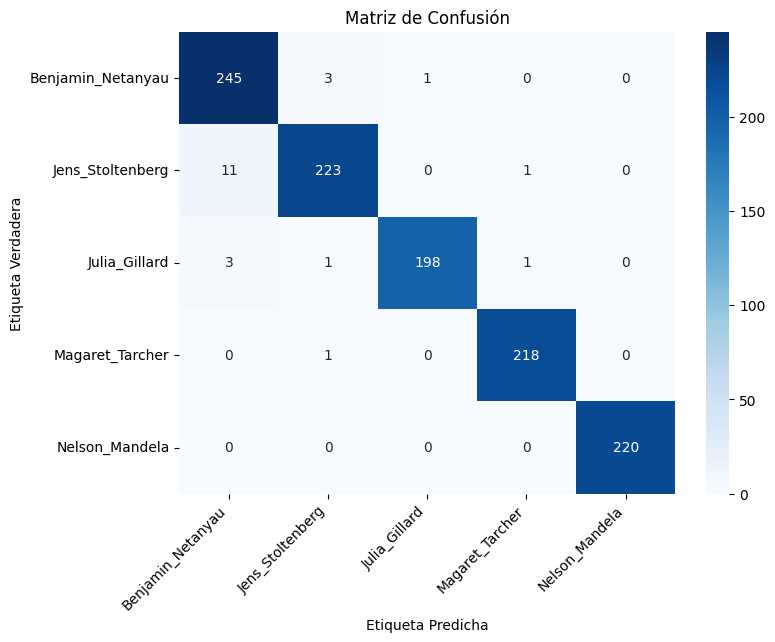

In [18]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score

# 🧪 Evaluar el modelo en el conjunto de prueba
y_pred_probabilities = model.predict(X_test)  # Predicciones en forma de probabilidades
y_pred = np.argmax(y_pred_probabilities, axis=1)  # Se selecciona la clase con mayor probabilidad

# 🔄 Decodificar las etiquetas a su formato original
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# 📊 Crear la matriz de confusión
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded, labels=speaker_folders)

# ✅ Calcular la precisión del modelo
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Precisión en la evaluación del conjunto de prueba: {accuracy}")

# 🎯 Calcular el puntaje F1 ponderado
f1 = f1_score(y_test_decoded, y_pred_decoded, labels=speaker_folders, average='weighted')
print(f"Puntaje F1 ponderado: {f1}")

# 🖼️ Graficar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
            xticklabels=speaker_folders, yticklabels=speaker_folders)

# 🔠 Rotar las etiquetas del eje X para mejor visualización
plt.xticks(rotation=45, ha="right")

plt.title("Matriz de Confusión")
plt.xlabel("Etiqueta Predicha")
plt.ylabel("Etiqueta Verdadera")
plt.show()


### 🔈 Nota sobre el uso de ruido de fondo

No utilizamos ruido de fondo en este caso, pero a continuación puedes ver algunas notas sobre cómo configurar modelos que **sí lo incluyen**, con el objetivo de lograr una mejor **generalización**. 🧠🌍


### 🔊 Importancia de Incluir Ruido de Fondo en los Datos de Entrenamiento

Incluir ruido de fondo en los datos de entrenamiento puede ser importante por varias razones:

---

#### 1. 🛡️ **Robustez ante Condiciones del Mundo Real**
En escenarios reales, los entornos rara vez son silenciosos. Incluir ruido de fondo ayuda al modelo a volverse más robusto frente a diversas condiciones ambientales, asegurando un buen rendimiento incluso en presencia de ruido, tal como ocurriría en su uso real.

---

#### 2. 🌍 **Generalización a Entornos Diversos**
Entrenar con datos que contienen ruido permite que el modelo generalice mejor a diferentes ambientes acústicos. Si el modelo solo aprende con datos limpios, podría tener dificultades para adaptarse a nuevos entornos con distintos niveles y tipos de ruido.

---

#### 3. 🚫 **Evitar el Sobreajuste a Datos Limpios**
Los modelos entrenados únicamente con datos limpios pueden volverse demasiado especializados en condiciones ideales y no funcionar bien en situaciones reales con ruido. Incluir ruido de fondo ayuda a prevenir este sobreajuste.

---

#### 4. 🔐 **Mejorar la Privacidad y Seguridad**
En aplicaciones como autenticación por voz o reconocimiento de hablantes, es crucial que el modelo sea robusto ante condiciones ruidosas. Esto garantiza que el modelo no sea fácilmente engañado por intentos de imitar una voz limpia.

---

#### 5. 🧪 **Mayor Realismo en la Generación de Datos Sintéticos**
Al crear conjuntos de datos sintéticos para entrenamiento, incorporar ruido de fondo hace que los datos sean más realistas. Los datos sintéticos con patrones de ruido realistas pueden ser valiosos, especialmente cuando es difícil obtener grandes cantidades de datos reales.

---

#### 6. 🎯 **Cumplir con Requisitos de la Aplicación**
Dependiendo de la aplicación, el modelo puede necesitar operar en entornos con distintos niveles de ruido. Entrenar con datos que incluyan diversas condiciones de ruido asegura que el modelo cumpla con los requisitos específicos de la aplicación.

---

#### 7. 👥 **Adaptarse a la Variabilidad del Comportamiento del Usuario**
Los usuarios pueden interactuar con dispositivos en distintos entornos, y su comportamiento puede introducir ruido de fondo. Entrenar con datos diversos ayuda al modelo a adaptarse a esta variabilidad en el comportamiento del usuario.
